In [220]:
from hashlib import sha1

import altair as alt
import numpy as np
import pandas as pd
import string
from sklearn import tree
from sklearn.dummy import DummyClassifier, DummyRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import make_column_transformer 
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.preprocessing import (
    FunctionTransformer,
    Normalizer,
    OneHotEncoder,
    StandardScaler,
    normalize,
    scale)
from sklearn.metrics import classification_report
from sklearn.svm import SVC, SVR
from sklearn.metrics import make_scorer, mean_squared_error, mean_absolute_error, r2_score

from scipy.stats import lognorm, loguniform, randint
from sklearn.linear_model import LogisticRegression
import sklearn.metrics
import scipy
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import make_scorer
alt.data_transformers.disable_max_rows()
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import f1_score

In [132]:
driver = pd.read_csv('IT_3.csv')
driver.head()

,ID,target,Gender,EngineHP,credit_history,Years_Experience,annual_claims,Marital_Status,Vehical_type,Miles_driven_annually,size_of_family,Age_bucket,EngineHP_bucket,Years_Experience_bucket,Miles_driven_annually_bucket,credit_history_bucket,State
0,1,1,F,522,656,1,0,Married,Car,14749.0,5,<18,>350,<3,<15k,Fair,IL
1,2,1,F,691,704,16,0,Married,Car,15389.0,6,28-34,>350,15-30,15k-25k,Good,NJ
2,3,1,M,133,691,15,0,Married,Van,9956.0,3,>40,90-160,15-30,<15k,Good,CT
3,4,1,M,146,720,9,0,Married,Van,77323.0,3,18-27,90-160,9-14',>25k,Good,CT
4,5,1,M,128,771,33,1,Married,Van,14183.0,4,>40,90-160,>30,<15k,Very Good,WY


In [133]:
driver.info()
print('\n')
driver.describe(include='all')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30240 entries, 0 to 30239
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            30240 non-null  int64  
 1   target                        30240 non-null  int64  
 2   Gender                        30240 non-null  object 
 3   EngineHP                      30240 non-null  int64  
 4   credit_history                30240 non-null  int64  
 5   Years_Experience              30240 non-null  int64  
 6   annual_claims                 30240 non-null  int64  
 7   Marital_Status                30240 non-null  object 
 8   Vehical_type                  30240 non-null  object 
 9   Miles_driven_annually         30232 non-null  float64
 10  size_of_family                30240 non-null  int64  
 11  Age_bucket                    30240 non-null  object 
 12  EngineHP_bucket               30240 non-null  object 
 13  Y

,ID,target,Gender,EngineHP,credit_history,Years_Experience,annual_claims,Marital_Status,Vehical_type,Miles_driven_annually,size_of_family,Age_bucket,EngineHP_bucket,Years_Experience_bucket,Miles_driven_annually_bucket,credit_history_bucket,State
count,30240.000000,30240.00000,30240,30240.000000,30240.000000,30240.000000,30240.000000,30240,30240,30232.000000,30240.000000,30240,30240,30240,30232,30240,30240
unique,NaN,NaN,2,NaN,NaN,NaN,NaN,2,4,NaN,NaN,5,4,5,3,5,50
top,NaN,NaN,M,NaN,NaN,NaN,NaN,Married,Car,NaN,NaN,>40,90-160,3-8',<15k,Good,NJ
freq,NaN,NaN,16359,NaN,NaN,NaN,NaN,19820,11582,NaN,NaN,12630,17840,10947,17585,13070,4884
mean,15120.500000,0.70754,NaN,196.604266,685.769775,13.255721,1.138459,NaN,NaN,17422.938939,4.521296,NaN,NaN,NaN,NaN,NaN,NaN
std,8729.680407,0.45490,NaN,132.346961,102.454307,9.890246,1.082913,NaN,NaN,17483.782840,2.286531,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,0.00000,NaN,80.000000,300.000000,1.000000,0.000000,NaN,NaN,5000.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN
25%,7560.750000,0.00000,NaN,111.000000,668.000000,5.000000,0.000000,NaN,NaN,9668.500000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN
50%,15120.500000,1.00000,NaN,141.000000,705.000000,10.000000,1.000000,NaN,NaN,12280.000000,5.000000,NaN,NaN,NaN,NaN,NaN,NaN
75%,22680.250000,1.00000,NaN,238.000000,753.000000,20.000000,2.000000,NaN,NaN,14697.250000,7.000000,NaN,NaN,NaN,NaN,NaN,NaN


In [134]:
driver.rename(columns={
    'target': 'Target',
    'Gender': 'Gender',
    'EngineHP': 'Engine HP',
    'credit_history': 'Credit History',
    'Years_Experience': 'Years Experience',
    'annual_claims': 'Annual Claims',
    'Marital_Status': 'Marital Status',
    'Vehical_type': 'Vehicle Type',
    'Miles_driven_annually': 'Miles Driven Annually',
    'size_of_family': 'Size of Family',
    'State': 'State'
}, inplace=True)
driver

,ID,Target,Gender,Engine HP,Credit History,Years Experience,Annual Claims,Marital Status,Vehicle Type,Miles Driven Annually,Size of Family,Age_bucket,EngineHP_bucket,Years_Experience_bucket,Miles_driven_annually_bucket,credit_history_bucket,State
0,1,1,F,522,656,1,0,Married,Car,14749.0,5,<18,>350,<3,<15k,Fair,IL
1,2,1,F,691,704,16,0,Married,Car,15389.0,6,28-34,>350,15-30,15k-25k,Good,NJ
2,3,1,M,133,691,15,0,Married,Van,9956.0,3,>40,90-160,15-30,<15k,Good,CT
3,4,1,M,146,720,9,0,Married,Van,77323.0,3,18-27,90-160,9-14',>25k,Good,CT
4,5,1,M,128,771,33,1,Married,Van,14183.0,4,>40,90-160,>30,<15k,Very Good,WY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30235,30236,1,F,398,491,6,3,Single,Truck,14509.0,2,35-40,>350,3-8',>25k,Very Poor,VT
30236,30237,0,M,128,745,22,4,Single,Utility,8597.0,6,>40,90-160,15-30,<15k,Very Good,OK
30237,30238,0,M,89,523,4,1,Married,Truck,49747.0,2,<18,<90,3-8',>25k,Very Poor,NY
30238,30239,1,F,129,703,14,1,Married,Truck,7553.0,1,>40,90-160,9-14',<15k,Good,NJ


#### Feature Engineering:

In [135]:
driver['Is_Married'] = (driver['Marital Status'] == 'Married').astype(int)
driver['Is_Car'] = (driver['Vehicle Type'] == 'Car').astype(int)

driver['Experience_Claims_Interact'] = driver['Years Experience'] * driver['Annual Claims']

driver.drop(columns=['Marital Status', 'Vehicle Type', 'Years Experience'], inplace=True)

driver

,ID,Target,Gender,Engine HP,Credit History,Annual Claims,Miles Driven Annually,Size of Family,Age_bucket,EngineHP_bucket,Years_Experience_bucket,Miles_driven_annually_bucket,credit_history_bucket,State,Is_Married,Is_Car,Experience_Claims_Interact
0,1,1,F,522,656,0,14749.0,5,<18,>350,<3,<15k,Fair,IL,1,1,0
1,2,1,F,691,704,0,15389.0,6,28-34,>350,15-30,15k-25k,Good,NJ,1,1,0
2,3,1,M,133,691,0,9956.0,3,>40,90-160,15-30,<15k,Good,CT,1,0,0
3,4,1,M,146,720,0,77323.0,3,18-27,90-160,9-14',>25k,Good,CT,1,0,0
4,5,1,M,128,771,1,14183.0,4,>40,90-160,>30,<15k,Very Good,WY,1,0,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30235,30236,1,F,398,491,3,14509.0,2,35-40,>350,3-8',>25k,Very Poor,VT,0,0,18
30236,30237,0,M,128,745,4,8597.0,6,>40,90-160,15-30,<15k,Very Good,OK,0,0,88
30237,30238,0,M,89,523,1,49747.0,2,<18,<90,3-8',>25k,Very Poor,NY,1,0,4
30238,30239,1,F,129,703,1,7553.0,1,>40,90-160,9-14',<15k,Good,NJ,1,0,14


#### Performing Exploratory Data Analysis:

In [136]:
target_counts = driver['Target'].value_counts().reset_index()
target_counts.columns = ['Target', 'Count']

# Create a bar chart using Altair
bar_chart = alt.Chart(target_counts).mark_bar().encode(
    x='Target:N',
    y='Count:Q',
    tooltip=['Target', 'Count']
).properties(
    title='Count of Target Categories',
    width=400,
    height=300
)
bar_chart

alt.Chart(...)

In [137]:
gender_target_counts = driver.groupby(['Gender', 'Target']).size().reset_index(name='Count')

stacked_bar_chart = alt.Chart(gender_target_counts).mark_bar().encode(
    x='Gender:N',
    y='Count:Q',
    color='Target:N',
    tooltip=['Gender', 'Target', 'Count']
).properties(
    title='Distribution of Target by Gender',
    width=400,
    height=300
)

stacked_bar_chart

alt.Chart(...)

In [138]:
numerical_columns = ['Target', 'Engine HP', 'Credit History', 'Annual Claims', 'Miles Driven Annually', 'Size of Family', 
                    'Is_Married', 'Is_Car', 'Experience_Claims_Interact']

num_plot = alt.Chart(driver).mark_rect().encode(
    alt.X(alt.repeat('column'), type='quantitative', bin=alt.Bin(maxbins=30)),
    alt.Y(alt.repeat('row'), type='quantitative', bin=alt.Bin(maxbins=30)),
    alt.Color('count()', title=None)
).properties(width=200, height=150).repeat(
    column=numerical_columns,
    row=numerical_columns
).resolve_scale(color='independent')

num_plot

alt.RepeatChart(...)

In [139]:
X = driver.drop(columns=['Target'])
y = driver['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)
X_train

,ID,Gender,Engine HP,Credit History,Annual Claims,Miles Driven Annually,Size of Family,Age_bucket,EngineHP_bucket,Years_Experience_bucket,Miles_driven_annually_bucket,credit_history_bucket,State,Is_Married,Is_Car,Experience_Claims_Interact
1518,1519,F,92,688,1,13476.0,6,>40,90-160,15-30,<15k,Good,MI,1,1,25
25383,25384,M,92,770,0,12806.0,4,>40,90-160,9-14',<15k,Very Good,MI,1,0,0
17061,17062,F,381,662,3,19877.0,3,35-40,>350,3-8',15k-25k,Fair,NJ,0,0,21
18956,18957,M,190,700,1,87389.0,6,18-27,161-350,3-8',>25k,Good,OR,1,0,8
10331,10332,F,80,712,0,11866.0,8,>40,<90,15-30,<15k,Good,OR,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28636,28637,F,136,786,1,11456.0,7,>40,90-160,15-30,<15k,Very Good,OR,1,0,22
17730,17731,M,114,674,0,8454.0,1,35-40,90-160,9-14',<15k,Good,VT,1,0,0
28030,28031,M,455,696,1,12213.0,2,18-27,>350,3-8',>25k,Good,MN,1,1,4
15725,15726,M,125,675,0,5772.0,2,>40,90-160,9-14',<15k,Good,NJ,1,0,0


In [140]:
X_train.info()
print('\n')
X_train.describe(include='all')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21168 entries, 1518 to 19966
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            21168 non-null  int64  
 1   Gender                        21168 non-null  object 
 2   Engine HP                     21168 non-null  int64  
 3   Credit History                21168 non-null  int64  
 4   Annual Claims                 21168 non-null  int64  
 5   Miles Driven Annually         21163 non-null  float64
 6   Size of Family                21168 non-null  int64  
 7   Age_bucket                    21168 non-null  object 
 8   EngineHP_bucket               21168 non-null  object 
 9   Years_Experience_bucket       21168 non-null  object 
 10  Miles_driven_annually_bucket  21163 non-null  object 
 11  credit_history_bucket         21168 non-null  object 
 12  State                         21168 non-null  object 
 13

,ID,Gender,Engine HP,Credit History,Annual Claims,Miles Driven Annually,Size of Family,Age_bucket,EngineHP_bucket,Years_Experience_bucket,Miles_driven_annually_bucket,credit_history_bucket,State,Is_Married,Is_Car,Experience_Claims_Interact
count,21168.000000,21168,21168.000000,21168.000000,21168.000000,21163.000000,21168.000000,21168,21168,21168,21163,21168,21168,21168.000000,21168.000000,21168.000000
unique,NaN,2,NaN,NaN,NaN,NaN,NaN,5,4,5,3,5,50,NaN,NaN,NaN
top,NaN,M,NaN,NaN,NaN,NaN,NaN,>40,90-160,3-8',<15k,Good,NJ,NaN,NaN,NaN
freq,NaN,11441,NaN,NaN,NaN,NaN,NaN,8855,12505,7572,12306,9115,3404,NaN,NaN,NaN
mean,15092.898951,NaN,196.498630,685.848545,1.138747,17566.637575,4.530329,NaN,NaN,NaN,NaN,NaN,NaN,0.656132,0.382700,10.860780
std,8728.423800,NaN,132.567725,102.187981,1.083501,17632.175347,2.281119,NaN,NaN,NaN,NaN,NaN,NaN,0.475009,0.486058,13.964578
min,1.000000,NaN,80.000000,300.000000,0.000000,5000.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000
25%,7552.250000,NaN,111.000000,668.000000,0.000000,9725.500000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000
50%,15112.000000,NaN,141.000000,705.000000,1.000000,12322.000000,5.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,8.000000
75%,22663.500000,NaN,238.000000,753.000000,2.000000,14748.500000,7.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,17.000000


In [141]:
column_names = X_train.columns.tolist()
column_names

['ID',
 'Gender',
 'Engine HP',
 'Credit History',
 'Annual Claims',
 'Miles Driven Annually',
 'Size of Family',
 'Age_bucket',
 'EngineHP_bucket',
 'Years_Experience_bucket',
 'Miles_driven_annually_bucket',
 'credit_history_bucket',
 'State',
 'Is_Married',
 'Is_Car',
 'Experience_Claims_Interact']

#### Pre-processing the values of features:

In [142]:
numeric_features = ['Engine HP', 'Credit History', 'Annual Claims', 'Miles Driven Annually', 'Size of Family',
                    'Is_Married', 'Is_Car', 'Experience_Claims_Interact']

binary_features = ['Gender']

drop_features = ['ID']

categorical_features = ['Age_bucket', 'EngineHP_bucket', 'Years_Experience_bucket', 'Miles_driven_annually_bucket',
                       'credit_history_bucket', 'State']

In [143]:
numeric_transformer = make_pipeline(SimpleImputer(strategy='median'), 
                                    StandardScaler())

binary_transformer = make_pipeline(OneHotEncoder(dtype=int, drop='if_binary'))

categorical_transformer = make_pipeline(SimpleImputer(strategy='most_frequent'),
                                        OneHotEncoder(dtype='int', handle_unknown='ignore'))


preprocessor = make_column_transformer(('drop', drop_features),
                                       (numeric_transformer, numeric_features),
                                       (categorical_transformer, categorical_features),
                                       (binary_transformer, binary_features)
)

#### Model Selection:

1. Dummy Classifier

In [144]:
dummy_clf = DummyClassifier(strategy='stratified', random_state=42)

scoring_metrics = ['accuracy', 'f1', 'recall', 'precision']

dummy_score = cross_validate(dummy_clf, X_train, y_train, scoring=scoring_metrics, cv=5, return_train_score=True)
dummy_scores = pd.DataFrame(dummy_score)

dummy_scores

,fit_time,score_time,test_accuracy,train_accuracy,test_f1,train_f1,test_recall,train_recall,test_precision,train_precision
0,0.005957,0.015231,0.593292,0.588520,0.714143,0.710415,0.717478,0.712963,0.710839,0.707885
1,0.002719,0.005505,0.585026,0.590292,0.708285,0.711686,0.711712,0.714238,0.704891,0.709151
2,0.001739,0.003792,0.584554,0.588048,0.707953,0.710106,0.711378,0.712653,0.704560,0.707578
3,0.001489,0.003419,0.604772,0.589489,0.722231,0.711104,0.725726,0.713654,0.718771,0.708571
4,0.001390,0.003399,0.588708,0.592914,0.710941,0.713514,0.714381,0.716073,0.707535,0.710973


In [169]:
dummy_mean = dummy_scores.mean()
dummy_mean_df = pd.DataFrame(list(dummy_mean.items()), columns=['variable', 'mean_score'])
dummy_mean_df

,variable,mean_score
0,fit_time,0.002659
1,score_time,0.006269
2,test_accuracy,0.591270
3,train_accuracy,0.589853
4,test_f1,0.712711
5,train_f1,0.711365
6,test_recall,0.716135
7,train_recall,0.713916
8,test_precision,0.709319
9,train_precision,0.708832


2. Logistic Regression Model:

In [146]:
score_metrics = ['accuracy', 'precision', 'recall', 'f1']

In [151]:
logistic_clf = make_pipeline(preprocessor, LogisticRegression(max_iter=1000))

logistic_scores = pd.DataFrame(cross_validate(logistic_clf, X_train, y_train, scoring=score_metrics, return_train_score=True, cv=5))
logistic_scores

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
0,0.142084,0.010706,0.708077,0.707925,0.708077,0.707925,1.0,1.0,0.829093,0.828988
1,0.106001,0.010089,0.707841,0.707984,0.707841,0.707984,1.0,1.0,0.828931,0.829029
2,0.103694,0.009627,0.707841,0.707984,0.707841,0.707984,1.0,1.0,0.828931,0.829029
3,0.105694,0.009996,0.708009,0.707942,0.708009,0.707942,1.0,1.0,0.829046,0.829000
4,0.106957,0.009569,0.708009,0.707942,0.708009,0.707942,1.0,1.0,0.829046,0.829000


In [171]:
logistic_mean = logistic_scores.mean()
logistic_mean_df = pd.DataFrame(list(logistic_mean.items()), columns=['variable', 'mean_score'])
logistic_mean_df

,variable,mean_score
0,fit_time,0.112886
1,score_time,0.009997
2,test_accuracy,0.707955
3,train_accuracy,0.707955
4,test_precision,0.707955
5,train_precision,0.707955
6,test_recall,1.000000
7,train_recall,1.000000
8,test_f1,0.829009
9,train_f1,0.829009


3. RandomForest Classifier Unbalanced Model:

In [154]:
unbalanced_pipe = make_pipeline(preprocessor, RandomForestClassifier(random_state=42))
unbalanced_scores = pd.DataFrame(cross_validate(unbalanced_pipe, X_train, y_train, scoring=score_metrics, return_train_score=True, cv=5))
unbalanced_scores

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
0,5.962106,0.084910,0.692253,1.0,0.707061,1.0,0.965310,1.0,0.816246,1.0
1,6.013931,0.085779,0.696268,1.0,0.707495,1.0,0.973307,1.0,0.819382,1.0
2,5.933510,0.085366,0.695560,1.0,0.708090,1.0,0.969636,1.0,0.818476,1.0
3,5.954844,0.083680,0.694543,1.0,0.708109,1.0,0.967301,1.0,0.817656,1.0
4,5.935570,0.085716,0.698323,1.0,0.709144,1.0,0.972973,1.0,0.820369,1.0


In [172]:
unbalanced_mean = unbalanced_scores.mean()
unbalanced_mean_df = pd.DataFrame(list(unbalanced_mean.items()), columns=['variable', 'mean_score'])
unbalanced_mean_df

,variable,mean_score
0,fit_time,5.959992
1,score_time,0.085090
2,test_accuracy,0.695389
3,train_accuracy,1.000000
4,test_precision,0.707980
5,train_precision,1.000000
6,test_recall,0.969705
7,train_recall,1.000000
8,test_f1,0.818426
9,train_f1,1.000000


4. RandomForest Classfier Balanced Model:

In [156]:
balanced_pipe = make_pipeline(preprocessor, RandomForestClassifier(random_state=77, class_weight='balanced'))
balanced_scores = pd.DataFrame(cross_validate(balanced_pipe, X_train, y_train, scoring=score_metrics, return_train_score=True, cv=5))
balanced_scores

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
0,6.233351,0.086193,0.692253,1.0,0.706859,1.0,0.965977,1.0,0.816350,1.0
1,6.113504,0.086402,0.698866,1.0,0.707971,1.0,0.977978,1.0,0.821354,1.0
2,6.134471,0.085609,0.696268,1.0,0.707495,1.0,0.973307,1.0,0.819382,1.0
3,6.121199,0.083931,0.697614,1.0,0.708932,1.0,0.971972,1.0,0.819871,1.0
4,6.183568,0.089746,0.697850,1.0,0.708394,1.0,0.974308,1.0,0.820340,1.0


In [173]:
balanced_mean = balanced_scores.mean()
balanced_mean_df = pd.DataFrame(list(balanced_mean.items()), columns=['variable', 'mean_score'])
balanced_mean_df

,variable,mean_score
0,fit_time,6.157219
1,score_time,0.086376
2,test_accuracy,0.696570
3,train_accuracy,1.000000
4,test_precision,0.707930
5,train_precision,1.000000
6,test_recall,0.972708
7,train_recall,1.000000
8,test_f1,0.819459
9,train_f1,1.000000


5. SVC Model:

In [158]:
svc_pipe = make_pipeline(preprocessor, SVC(random_state=42))
svc_scores = pd.DataFrame(cross_validate(svc_pipe, X_train, y_train, scoring=score_metrics, return_train_score=True, cv=5))
svc_scores

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
0,22.696444,1.755894,0.708077,0.707925,0.708077,0.707925,1.0,1.0,0.829093,0.828988
1,19.475482,1.791257,0.707841,0.707984,0.707841,0.707984,1.0,1.0,0.828931,0.829029
2,19.498899,1.746003,0.707841,0.707984,0.707841,0.707984,1.0,1.0,0.828931,0.829029
3,19.460914,1.744767,0.708009,0.707942,0.708009,0.707942,1.0,1.0,0.829046,0.829000
4,19.429888,1.753850,0.708009,0.707942,0.708009,0.707942,1.0,1.0,0.829046,0.829000


In [176]:
svc_mean = svc_scores.mean()
svc_mean_df = pd.DataFrame(list(svc_mean.items()), columns=['variable', 'mean_score'])
svc_mean_df

,variable,mean_score
0,fit_time,20.112325
1,score_time,1.758354
2,test_accuracy,0.707955
3,train_accuracy,0.707955
4,test_precision,0.707955
5,train_precision,0.707955
6,test_recall,1.000000
7,train_recall,1.000000
8,test_f1,0.829009
9,train_f1,0.829009


#### Comparing the above model scores:

In [190]:
dummy_mean_df.rename(columns={'mean_score': 'mean_score_dummy'}, inplace=True)
logistic_mean_df.rename(columns={'mean_score': 'mean_score_logistic'}, inplace=True)
unbalanced_mean_df.rename(columns={'mean_score': 'mean_score_unbalanced'}, inplace=True)
balanced_mean_df.rename(columns={'mean_score': 'mean_score_balanced'}, inplace=True)
svc_mean_df.rename(columns={'mean_score': 'mean_score_svc'}, inplace=True)

merged_df = pd.concat([dummy_mean_df.set_index('variable'),
                       logistic_mean_df.set_index('variable'),
                       unbalanced_mean_df.set_index('variable'),
                       balanced_mean_df.set_index('variable'),
                       svc_mean_df.set_index('variable')],
                      axis=1)

merged_df.reset_index(inplace=True)


merged_df

,variable,mean_score_dummy,mean_score_logistic,mean_score_unbalanced,mean_score_balanced,mean_score_svc
0,fit_time,0.002659,0.112886,5.959992,6.157219,20.112325
1,score_time,0.006269,0.009997,0.085090,0.086376,1.758354
2,test_accuracy,0.591270,0.707955,0.695389,0.696570,0.707955
3,train_accuracy,0.589853,0.707955,1.000000,1.000000,0.707955
4,test_f1,0.712711,0.829009,0.818426,0.819459,0.829009
5,train_f1,0.711365,0.829009,1.000000,1.000000,0.829009
6,test_recall,0.716135,1.000000,0.969705,0.972708,1.000000
7,train_recall,0.713916,1.000000,1.000000,1.000000,1.000000
8,test_precision,0.709319,0.707955,0.707980,0.707930,0.707955
9,train_precision,0.708832,0.707955,1.000000,1.000000,0.707955


In [200]:
filtered_df = merged_df.loc[2:10, :]
filtered_df_long = filtered_df.melt(id_vars='variable', var_name='model', value_name='score')

chart = alt.Chart(filtered_df_long).mark_bar().encode(
    x=alt.X('variable', title='Variable'),
    y=alt.Y('score', title='Score'),
    color='model',
    column='model',
    tooltip=['variable', 'model', 'score']
).properties(
    width=300,
    height=200
)

chart

alt.Chart(...)

In [201]:
filter_df = merged_df.loc[0:3, :]
filter_df_long = filter_df.melt(id_vars='variable', var_name='model', value_name='score')

time_chart = alt.Chart(filter_df_long).mark_bar().encode(
    x=alt.X('variable', title='Variable'),
    y=alt.Y('score', title='Score'),
    color='model',
    column='model',
    tooltip=['variable', 'model', 'score']
).properties(
    width=300,
    height=200
)

time_chart

alt.Chart(...)

#### Performing Hyperparameter Optimization for LogisticRegression Model:

In [203]:
logistic_pipeline = make_pipeline(preprocessor, LogisticRegression(max_iter=1000))

param_grid = {
    'logisticregression__C': scipy.stats.uniform(0, 100)}

random_search = RandomizedSearchCV(
    logistic_pipeline,
    param_grid,
    n_iter=50,
    cv=3,
    verbose=1,
    n_jobs=-1,
    scoring="f1",
    random_state=123,
)
random_search.fit(X_train, y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('columntransformer',
                                              ColumnTransformer(transformers=[('drop',
                                                                               'drop',
                                                                               ['ID']),
                                                                              ('pipeline-1',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('standardscaler',
                                                                                                StandardScaler())]),
                                                                               ['Engine '
                                                                                'HP',
                                                                                'Credit '
                                                                                'History',
                                                                                'Annual '
                                                                                'Claims',
                                                                                'Miles '
                                                                                'Driven '
                                                                                'Annually',
                                                                                'Size '
                                                                                'of '
                                                                                'Family',
                                                                                'Is_Married...
                                                                              ('pipeline-3',
                                                                               Pipeline(steps=[('onehotencoder',
                                                                                                OneHotEncoder(drop='if_binary',
                                                                                                              dtype=<class 'int'>))]),
                                                                               ['Gender'])])),
                                             ('logisticregression',
                                              LogisticRegression(max_iter=1000))]),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'logisticregression__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x141700430>},
                   random_state=123, scoring='f1', verbose=1)

In [208]:
optimal_parameters = random_search.best_params_
optimal_score = random_search.best_score_
optimal_parameters, optimal_score

({'logisticregression__C': 69.64691855978616}, 0.8290092364668876)

In [209]:
training_score = random_search.score(X_train, y_train)
testin_score = random_search.score(X_test, y_test)

training_score, testin_score

(0.8290092382585607, 0.8280583903888387)

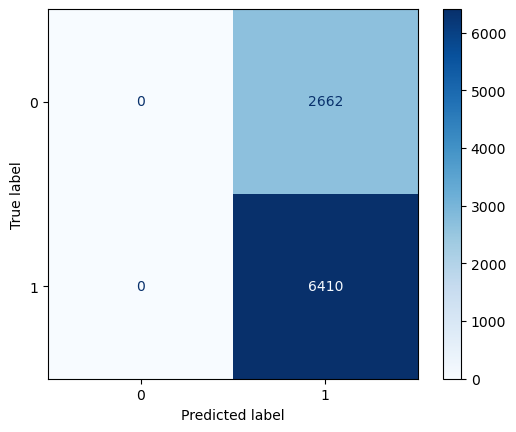

In [215]:
cm_plot = ConfusionMatrixDisplay.from_estimator(random_search, X_test, y_test, values_format='d', cmap='Blues')
cm_plot

In [224]:
import warnings
warnings.filterwarnings('ignore')

report = classification_report(y_test, random_search.predict(X_test), zero_division='warn')
print(report)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2662
           1       0.71      1.00      0.83      6410

    accuracy                           0.71      9072
   macro avg       0.35      0.50      0.41      9072
weighted avg       0.50      0.71      0.59      9072



In [227]:
y_pred = random_search.predict(X_test)
weighted_f1 = f1_score(y_test, y_pred, average='weighted', zero_division=1)
print("Weighted F1 score:", weighted_f1)

Weighted F1 score: 0.5850809394171578
